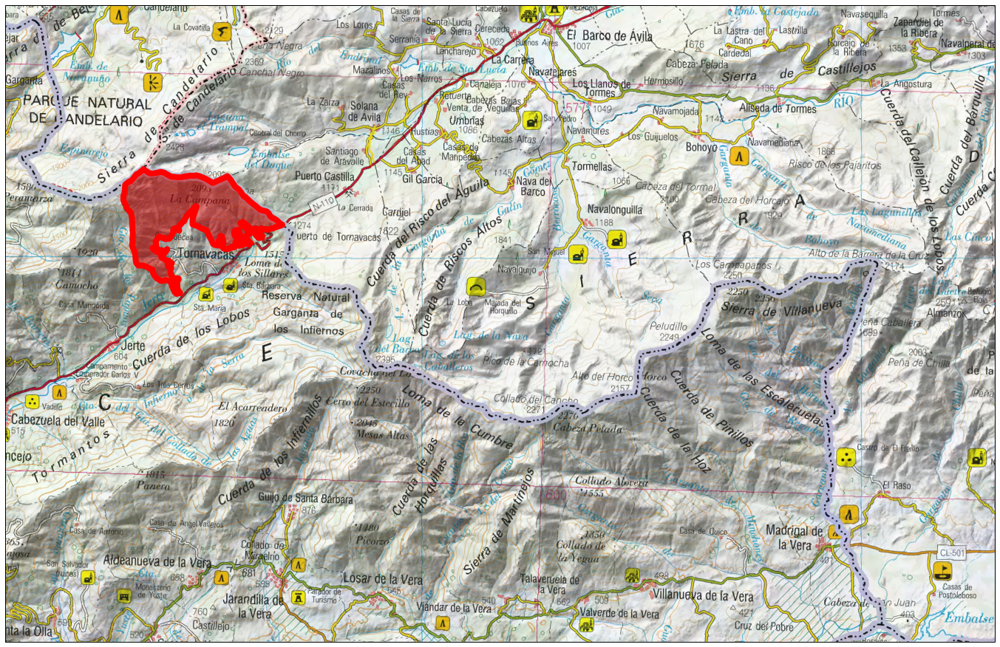

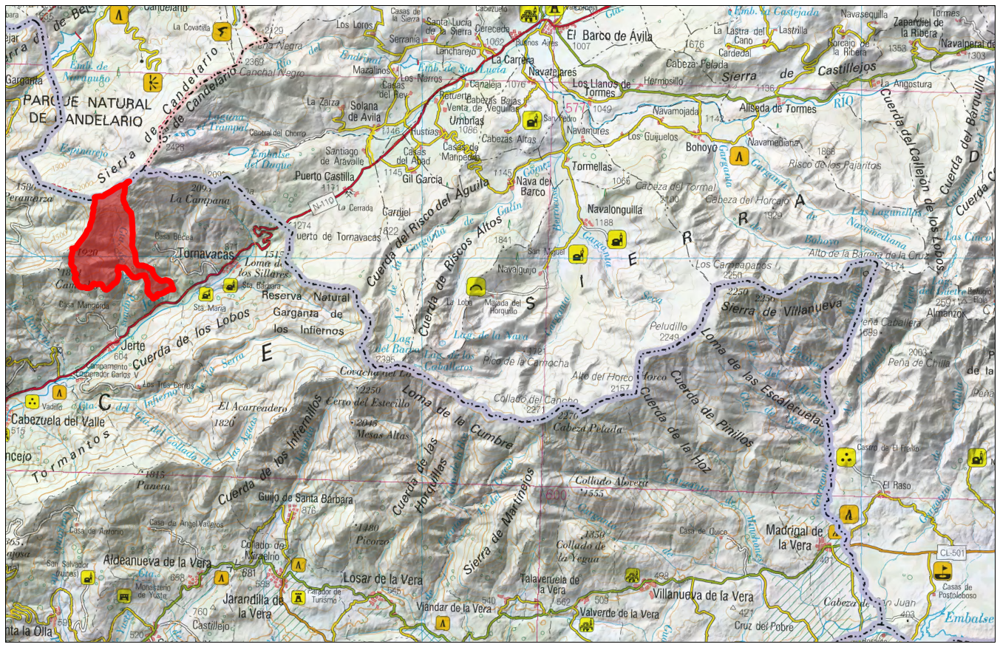

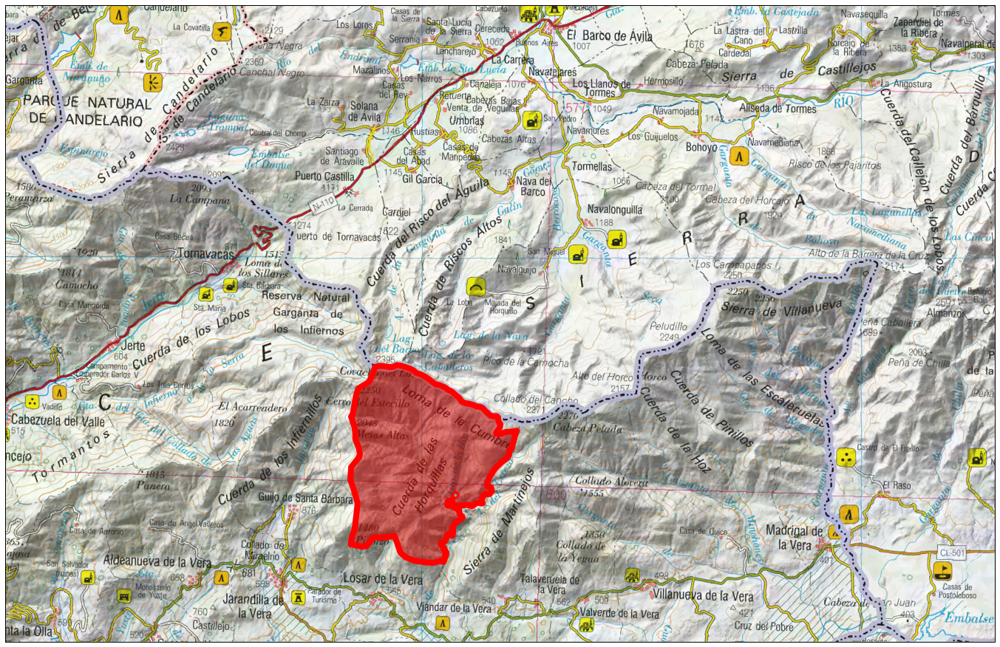

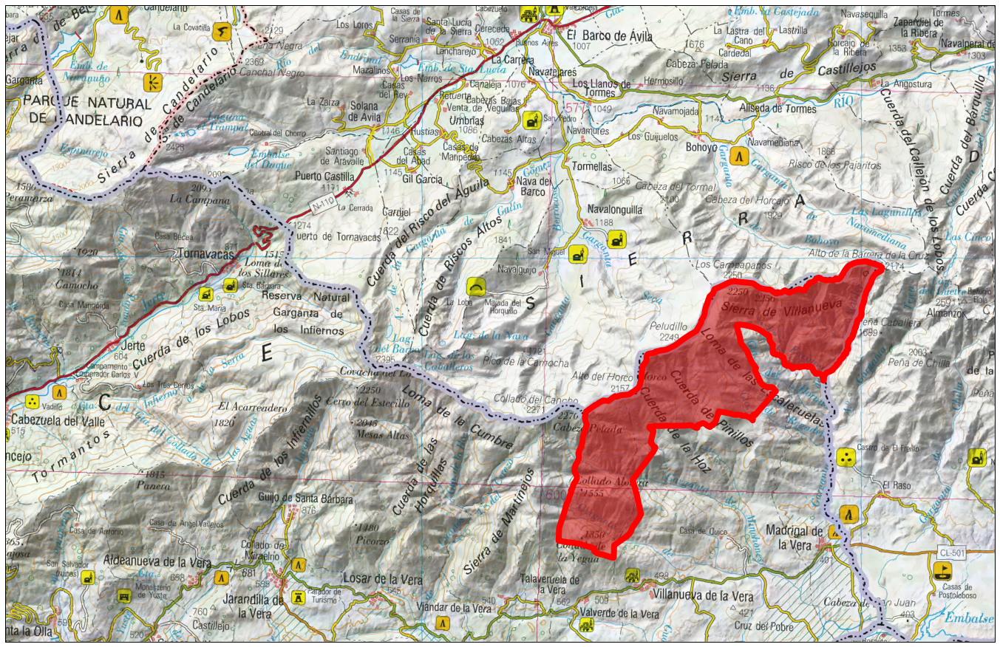

In [2]:
import psycopg2
import geopandas as gpd
import matplotlib.pyplot as plt
from config import config
import matplotlib.patches as mpatches
import cartopy.crs as ccrs

params = config()
conn = psycopg2.connect(**params)

marco = gpd.read_file('../BRUTOS/cartografia/marco_mapa/marco_mapa.shp')

proj = ccrs.epsg('25830')

zonas = ['tornavacas', 'jerte', 'losar', 'madrigal']
for zona in zonas:
    ze = gpd.read_postgis('select * from zona_estudio_{}'.format(zona), conn)
    fig = plt.figure(figsize=(24,18))
    ax = plt.axes(projection=proj)
    lim = list(marco.bounds.iloc[0])
    ax.set_extent([lim[0],lim[2], lim[1], lim[3]], crs=proj)

    ax.add_wms(wms='https://www.ign.es/wms-inspire/mapa-raster', layers=['mtn_rasterizado'])
    ax.add_geometries(ze['geom'], facecolor=(0.8,0,0,0.5), edgecolor='red', linewidth=8, crs=proj)
    fig.savefig('static/images/ubicacion_{}'.format(zona), bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close(fig)